In [9]:
# -*- coding: utf-8 -*-

#### Allow the necessary imports to be installed

In [6]:

%%!
pip install --trusted-host pypi.org ipython-sql


['Requirement already satisfied: ipython-sql in c:\\osgeo4~1\\apps\\python37\\lib\\site-packages (0.3.9)',
 'Requirement already satisfied: ipython-genutils>=0.1.0 in c:\\osgeo4~1\\apps\\python37\\lib\\site-packages (from ipython-sql) (0.2.0)',
 'Requirement already satisfied: sqlparse in c:\\osgeo4~1\\apps\\python37\\lib\\site-packages (from ipython-sql) (0.3.1)',
 'Requirement already satisfied: sqlalchemy>=0.6.7 in c:\\osgeo4~1\\apps\\python37\\lib\\site-packages (from ipython-sql) (1.3.16)',
 'Requirement already satisfied: six in c:\\users\\andre\\appdata\\roaming\\python\\python37\\site-packages (from ipython-sql) (1.12.0)',
 'Requirement already satisfied: ipython>=1.0 in c:\\osgeo4~1\\apps\\python37\\lib\\site-packages (from ipython-sql) (7.13.0)',
 'Requirement already satisfied: prettytable in c:\\osgeo4~1\\apps\\python37\\lib\\site-packages (from ipython-sql) (0.7.2)',
 'Requirement already satisfied: pygments in c:\\osgeo4~1\\apps\\python37\\lib\\site-packages (from ipython

In [7]:
%%!
pip install wget

['Requirement already satisfied: wget in c:\\osgeo4~1\\apps\\python37\\lib\\site-packages (3.2)',
 'WARNING: You are using pip version 20.0.2; however, version 20.1 is available.',
 "You should consider upgrading via the 'c:\\osgeo4~1\\bin\\python3.exe -m pip install --upgrade pip' command."]

In [1]:
import os
import sys
from osgeo import ogr
os.environ['QT_QPA_PLATFORM'] = 'offscreen'
#sys.path.insert(0,'/usr/local/share/qgis/python')
from qgis.core import *
#QgsApplication.setPrefixPath("/usr/local", True) 
from qgis.server import *
from qgis.gui import *
from qgis import processing

from qgis.PyQt.QtGui import QColor, QImage
from qgis.PyQt.QtCore import QSize, QBuffer, QIODevice



qgs = QgsApplication([], False)
qgs.initQgis()
print(QgsApplication.showSettings())

from qgis.PyQt.QtGui import QColor, QImage
from qgis.PyQt.QtCore import QSize, QBuffer, QIODevice
from IPython.display import Image

Application state:
QGIS_PREFIX_PATH env var:		C:/OSGEO4~1/apps/qgis
Prefix:		C:/OSGEO4~1/apps/qgis
Plugin Path:		C:/OSGEO4~1/apps/qgis/plugins
Package Data Path:	C:/OSGEO4~1/apps/qgis/.
Active Theme Name:	
Active Theme Path:	C:/OSGEO4~1/apps/qgis/./resources/themes\\icons/
Default Theme Path:	:/images/themes/default/
SVG Search Paths:	C:/OSGEO4~1/apps/qgis/./svg/
		C:/Users/andre/AppData/Roaming/python3\profiles\default/svg/
User DB Path:	C:/OSGEO4~1/apps/qgis/./resources/qgis.db
Auth DB Path:	C:/Users/andre/AppData/Roaming/python3\profiles\default/qgis-auth.db



# Code to Join two Layers (shp and csv) with a field in common

In [4]:
vectorLyr=QgsVectorLayer("C:/OSGeo4W64/bin/Andre/Covid-19Brazil/Tables/ShapesBrazil/lml_unidade_federacao_a.shp","Brasil","ogr")
vectorLyr.isValid()

uri='file:///C:/OSGeo4W64/bin/Andre/Covid-19Brazil/Tables/cases-brazil-total.csv?delimiter=,'
infoLyr=QgsVectorLayer(uri,'casosBrasil','delimitedtext')
infoLyr.isValid()

QgsProject.instance().addMapLayer(vectorLyr)
QgsProject.instance().addMapLayer(infoLyr)
csvField='state'
shpField='sigla'

joinObject=QgsVectorLayerJoinInfo()
joinObject.setJoinFieldName(csvField)
joinObject.setTargetFieldName(shpField)
joinObject.setJoinLayerId(infoLyr.id())
joinObject.setUsingMemoryCache(False)
joinObject.setJoinLayer(infoLyr)
vectorLyr.addJoin(joinObject)

vlayer = QgsProject.instance().mapLayersByName('Brasil')[0]

for field in vlayer.fields():
    print("Column "+field.name()+" Load")

Column nome Load
Column geometriaa Load
Column sigla Load
Column geocodigo Load
Column casosBrasil_country Load
Column casosBrasil_totalCases Load
Column casosBrasil_totalCasesMS Load
Column casosBrasil_notConfirmedByMS Load
Column casosBrasil_deaths Load
Column casosBrasil_deathsMS Load
Column casosBrasil_URL Load
Column casosBrasil_deaths_per_100k_inhabitants Load
Column casosBrasil_totalCases_per_100k_inhabitants Load
Column casosBrasil_deaths_by_totalCases Load
Column casosBrasil_recovered Load
Column casosBrasil_suspects Load
Column casosBrasil_tests Load
Column casosBrasil_tests_per_100k_inhabitants Load


## Use Label (totalCases) to show number of cases in Brazil per State

In [5]:
from qgis.utils import iface


label_settings = QgsPalLayerSettings()
label_settings.drawBackground = True
label_settings.fieldName = "casosBrasil_totalCases"

text_format = QgsTextFormat()
background_color = QgsTextBackgroundSettings()

background_color.setEnabled(False)
text_format.setBackground(background_color )
label_settings.setFormat(text_format)

vlayer.setLabeling(QgsVectorLayerSimpleLabeling(label_settings))
vlayer.setLabelsEnabled(True)
vlayer.triggerRepaint()


Gerar mapa com 1000 por 864


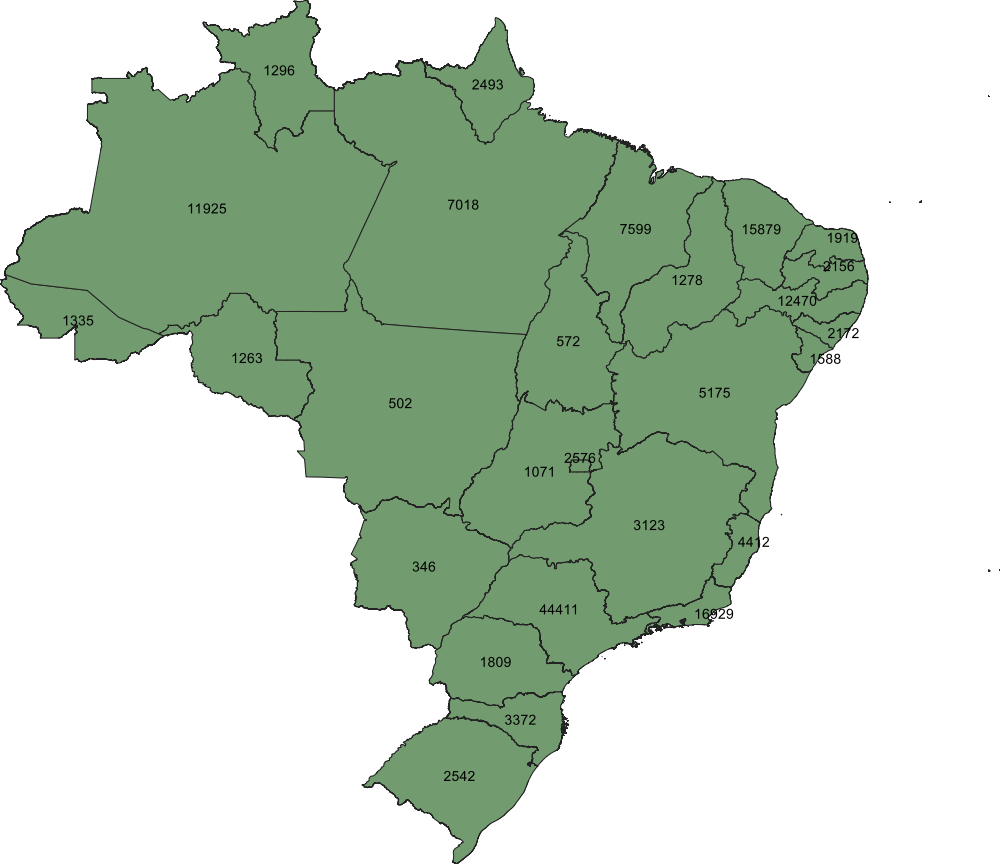

In [8]:
vlayer = QgsProject.instance().mapLayersByName('Brasil')[0]

xt = vlayer.extent()
# print(xt)
width  = 1000
height = int(width*xt.height()/xt.width())
print("Gerar mapa com {} por {}".format(width, height))

options = QgsMapSettings()
options.setLayers([vlayer])
options.setBackgroundColor(QColor(255, 255, 255))

options.setOutputSize(QSize(width, height))
options.setExtent(xt)
           
render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
image.save('fig/brasilCases.png',"PNG")
Image( imgbuf.data() )


### To be able to match this two layers, it was needed to change a field in csv file.
### So, was opened the original file, made some restrictions and write a new csv file.
### At the end, everything worked just fine.

### Exemple:
Abadia dos Dourados/MG ---> Abadia dos Dourados

In [2]:

from codecs import EncodedFile
import csv

r = csv.reader(open('C:/OSGeo4W64/bin/Andre/Covid-19Brazil/Tables/cases-brazil-cities.csv', "rt", encoding='utf-8')) # Here your csv file
lines = list(r)
i=0
for value in lines:
    lines[i][2]=value[2].split("/")[0]
    i+=1
writer = csv.writer(open('C:/OSGeo4W64/bin/Andre/Covid-19Brazil/Tables/cases-cities.csv', 'wt',encoding='utf-8'))
writer.writerows(lines)


## Join Brazil cities with covid data of that cities

In [3]:
vectorLyr=QgsVectorLayer("C:/OSGeo4W64/bin/Andre/Covid-19Brazil/Tables/ShapesBrazil/lml_municipio_a.shp","brasilCidades","ogr")
vectorLyr.isValid()
#vlayer = QgsProject.instance().addMapLayer(vectorLyr)

uri='file:///C:/OSGeo4W64/bin/Andre/Covid-19Brazil/Tables/cases-cities.csv?delimiter=,'
infoLyr=QgsVectorLayer(uri,'casosCidadesBrasil','delimitedtext')
infoLyr.isValid()

QgsProject.instance().addMapLayer(vectorLyr)
QgsProject.instance().addMapLayer(infoLyr)
csvField='city'
shpField='nome'

joinObject=QgsVectorLayerJoinInfo()
joinObject.setJoinFieldName(csvField)
joinObject.setTargetFieldName(shpField)
joinObject.setJoinLayerId(infoLyr.id())
joinObject.setUsingMemoryCache(False)
joinObject.setJoinLayer(infoLyr)
vectorLyr.addJoin(joinObject)

vlayer = QgsProject.instance().mapLayersByName('brasilCidades')[0]



for field in vlayer.fields():
    print("Column "+field.name()+" Load")

'''
Column nome Load
Column geometriaa Load
Column geocodigo Load
Column anoderefer Load
'''

Column nome Load
Column geometriaa Load
Column geocodigo Load
Column anoderefer Load
Column casosCidadesBrasil_country Load
Column casosCidadesBrasil_state Load
Column casosCidadesBrasil_ibgeID Load
Column casosCidadesBrasil_deaths Load
Column casosCidadesBrasil_totalCases Load
Column casosCidadesBrasil_deaths_per_100k_inhabitants Load
Column casosCidadesBrasil_totalCases_per_100k_inhabitants Load
Column casosCidadesBrasil_deaths_by_totalCases Load


'\nColumn nome Load\nColumn geometriaa Load\nColumn geocodigo Load\nColumn anoderefer Load\n'

In [4]:
from qgis.utils import iface


label_settings = QgsPalLayerSettings()
label_settings.drawBackground = True
label_settings.fieldName = "casosCidadesBrasil_totalCases"

text_format = QgsTextFormat()
background_color = QgsTextBackgroundSettings()

background_color.setEnabled(False)
text_format.setBackground(background_color )
label_settings.setFormat(text_format)

vlayer.setLabeling(QgsVectorLayerSimpleLabeling(label_settings))
vlayer.setLabelsEnabled(True)
vlayer.triggerRepaint()

39.02075882699992
Gerar mapa com 3000 por 2593


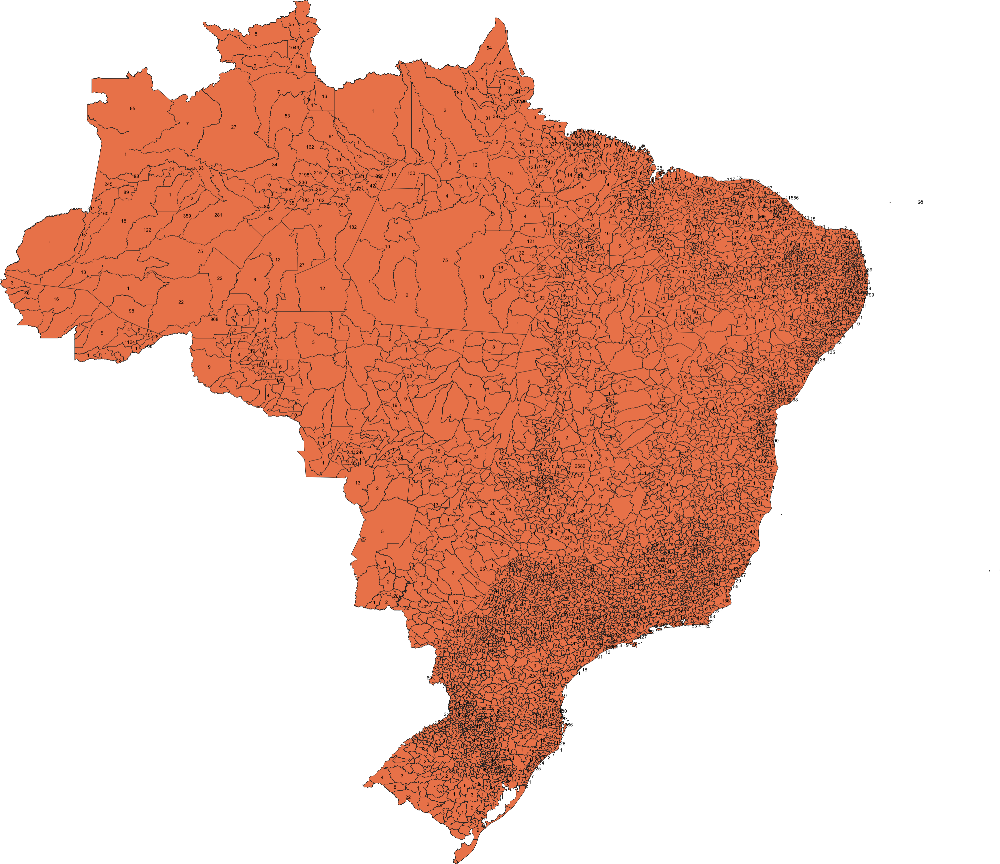

In [5]:
vlayer = QgsProject.instance().mapLayersByName('brasilCidades')[0]
xt = vlayer.extent()

print(xt.height())
width  = 3000
height = int(width*xt.height()/xt.width())
print("Gerar mapa com {} por {}".format(width, height))

options = QgsMapSettings()
options.setLayers([vlayer])
options.setBackgroundColor(QColor(255, 255, 255))

options.setOutputSize(QSize(width, height))
options.setExtent(xt)
           
render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
image.save('fig/brasilCasesn.png',"PNG")
Image( imgbuf.data() )


That amount of data is hard to handle, so is recommended some zoom to see better (the image have good resolution).
### So, it's better build a way to see better where exists more cases.

## Create alayer based on rules.

In [9]:
from qgis.PyQt import QtGui

myVectorLayer = QgsProject.instance().mapLayersByName('brasilCidades')[0]
myTargetField = 'casosCidadesBrasil_totalCases'
myRangeList = []
myOpacity = 1
# Make our first symbol and range...
myMin = 0.0
myMax = 0.0
myLabel = 'Group 1'
myColour = QtGui.QColor('#ffffff')
mySymbol1 = QgsSymbol.defaultSymbol(myVectorLayer.geometryType())
mySymbol1.setColor(myColour)
mySymbol1.setOpacity(myOpacity)
myRange1 = QgsRendererRange(myMin, myMax, mySymbol1, myLabel)
myRangeList.append(myRange1)

#now make another symbol and range...
myMin = 0.0
myMax = 3.0
myLabel = 'Group 2'
myColour = QtGui.QColor('#ffbfbf')
mySymbol2 = QgsSymbol.defaultSymbol(
     myVectorLayer.geometryType())
mySymbol2.setColor(myColour)
mySymbol2.setOpacity(myOpacity)
myRange2 = QgsRendererRange(myMin, myMax, mySymbol2, myLabel)
myRangeList.append(myRange2)

#and another
myMin = 3.0
myMax = 25.0
myLabel = 'Group 3'
myColour = QtGui.QColor('#ff8080')
mySymbol3 = QgsSymbol.defaultSymbol(
     myVectorLayer.geometryType())
mySymbol3.setColor(myColour)
mySymbol3.setOpacity(myOpacity)
myRange3 = QgsRendererRange(myMin, myMax, mySymbol3, myLabel)
myRangeList.append(myRange3)

#aaaaaaaaaaaahh
myMin = 25.0
myMax = 70.0
myLabel = 'Group 4'
myColour = QtGui.QColor('#ff4040')
mySymbol4 = QgsSymbol.defaultSymbol(
     myVectorLayer.geometryType())
mySymbol4.setColor(myColour)
mySymbol4.setOpacity(myOpacity)
myRange4 = QgsRendererRange(myMin, myMax, mySymbol4, myLabel)
myRangeList.append(myRange4)

#............
myMin = 70.1
myMax = 200.0
myLabel = 'Group 5'
myColour = QtGui.QColor('#ff0000')
mySymbol5 = QgsSymbol.defaultSymbol(
     myVectorLayer.geometryType())
mySymbol5.setColor(myColour)
mySymbol5.setOpacity(myOpacity)
myRange5 = QgsRendererRange(myMin, myMax, mySymbol5, myLabel)
myRangeList.append(myRange5)

#and another one 
myMin = 200.1
myMax = 27000.0
myLabel = 'Group 6'
myColour = QtGui.QColor('#00ff33')
mySymbol6 = QgsSymbol.defaultSymbol(
     myVectorLayer.geometryType())
mySymbol6.setColor(myColour)
mySymbol6.setOpacity(myOpacity)
myRange6 = QgsRendererRange(myMin, myMax, mySymbol6, myLabel)
myRangeList.append(myRange6)



myRenderer = QgsGraduatedSymbolRenderer('', myRangeList)
myClassificationMethod = QgsApplication.classificationMethodRegistry().method("EqualInterval")
myRenderer.setClassificationMethod(myClassificationMethod)
myRenderer.setClassAttribute(myTargetField)

myVectorLayer.setRenderer(myRenderer)

### This rendering have a problem - Some part of the map doesn't appear
### There is no register of covid for  those cities.

39.02075882699992
Gerar mapa com 3000 por 2593
Worst results are green


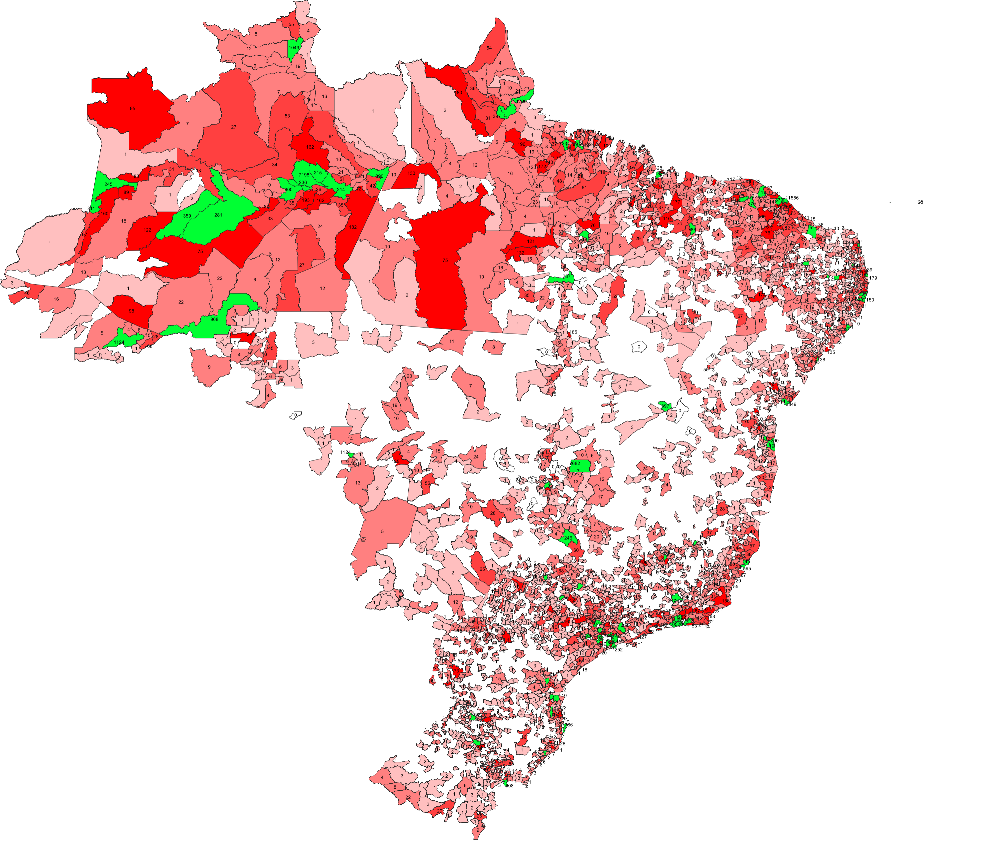

In [10]:

vlayer = QgsProject.instance().mapLayersByName('brasilCidades')[0]
xt = vlayer.extent()

print(xt.height())
width  = 3000
height = int(width*xt.height()/xt.width())
print("Gerar mapa com {} por {}".format(width, height))
print("Worst results are green")
options = QgsMapSettings()
options.setLayers([vlayer])
options.setBackgroundColor(QColor(255, 255, 255))

options.setOutputSize(QSize(width, height))
options.setExtent(xt)
           
render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )

image.save( imgbuf,"PNG" )
Image( imgbuf.data() )



### To see all map, even without all data, another layer (the original) was placed under the previous.

Layer lml_municipio_a loaded
Layer layer_styles loaded
39.02075882699992
Gerar mapa com 3000 por 2593


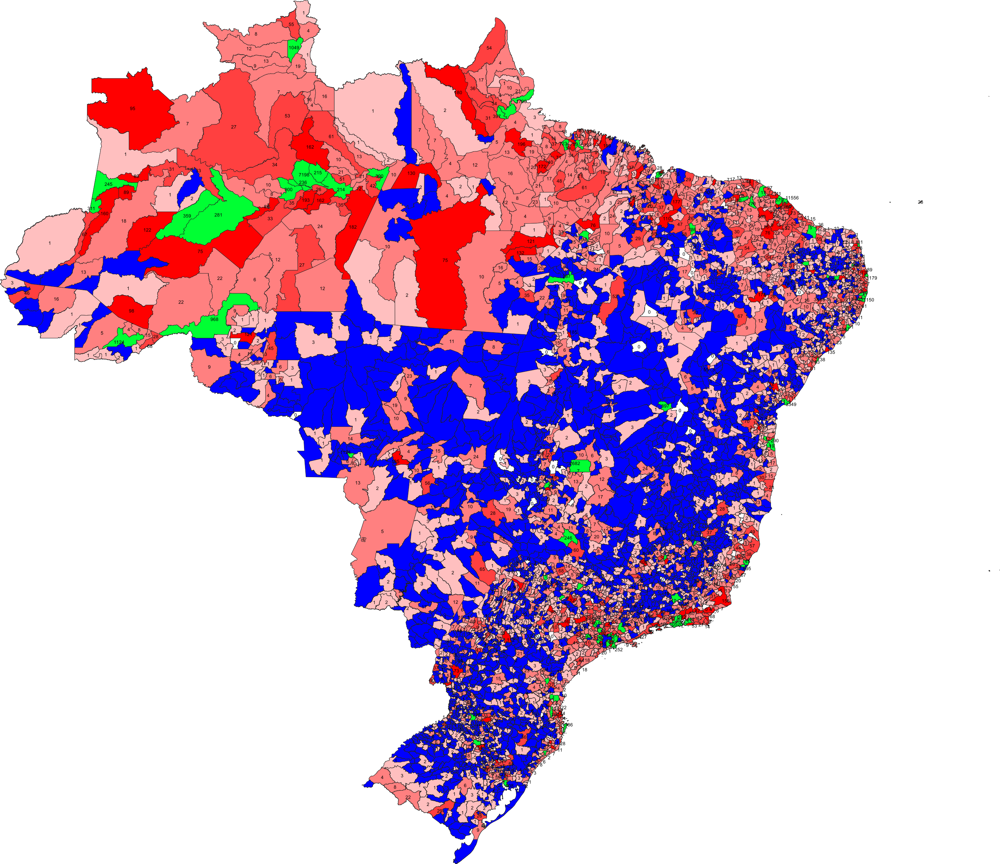

In [13]:

        
        
vlayer = QgsProject.instance().mapLayersByName('brasilCidades')[0]
xt = vlayer.extent()

covid_gpkg = 'C:/OSGeo4W64/bin/Andre/Covid-19Brazil/Tables/brasil.gpkg'
conn = ogr.Open(covid_gpkg)
for i in conn:
    vlayer2 = QgsVectorLayer("{}|layername={}".format(covid_gpkg, i.GetName()), i.GetName(), "ogr")
    if not vlayer.isValid():
        print("Layer {} failed to load".format(i.GetName()))
    else:
        QgsProject.instance().addMapLayer(vlayer)
        print("Layer {} loaded".format(i.GetName()))

vlayer2=QgsProject.instance().mapLayersByName('lml_municipio_a')[0]



print(xt.height())
width  = 3000
height = int(width*xt.height()/xt.width())
print("Gerar mapa com {} por {}".format(width, height))
print("Blue => No data")
options = QgsMapSettings()
options.setLayers([vlayer,vlayer2])
options.setBackgroundColor(QColor(255, 255, 255))

options.setOutputSize(QSize(width, height))
options.setExtent(xt)
           
render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save('fig/brasiloverlayer.png',"PNG")
image.save( imgbuf,"PNG" )
Image( imgbuf.data() )

### Showing world Map with covid cases - https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv
### Used a package created on QGis software

In [27]:
covid_gpkg = 'C:/OSGeo4W64/bin/Andre/Covid-19Brazil/Tables/world.gpkg'
conn = ogr.Open(covid_gpkg)
for i in conn:
    vlayer = QgsVectorLayer("{}|layername={}".format(covid_gpkg, i.GetName()), i.GetName(), "ogr")
    if not vlayer.isValid():
        print("Layer {} failed to load".format(i.GetName()))
    else:
        QgsProject.instance().addMapLayer(vlayer)
        print("Layer {} loaded".format(i.GetName()))

Layer 99bfd9e7-bb42-4728-87b5-07f8c8ac631c2020328-1-1vef4ev.lu5nk loaded
Layer cases_country-cases_country loaded
Layer layer_styles loaded


173.6235961914063
Gerar mapa com 3000 por 1446
Worst results are green


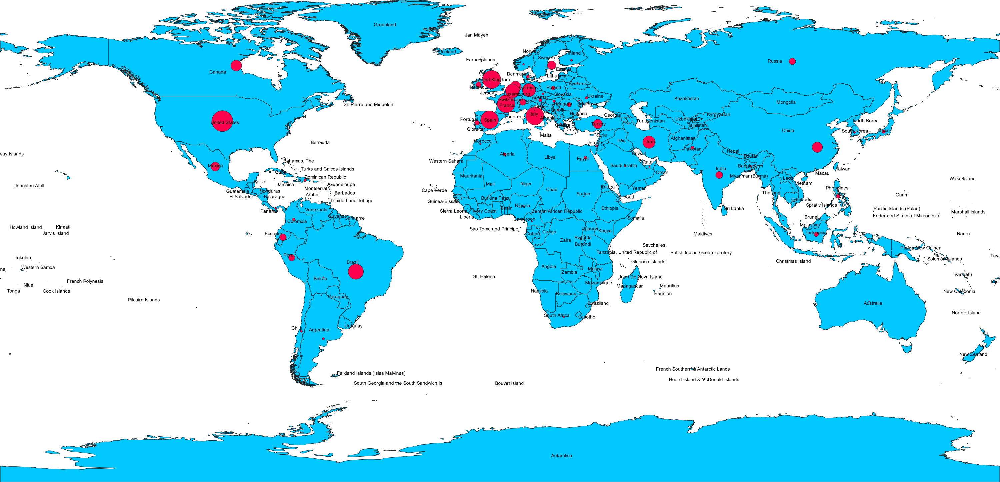

In [28]:
vlayer2 =  QgsProject.instance().mapLayersByName('cases_country-cases_country')[0]
vlayer = QgsProject.instance().mapLayersByName('99bfd9e7-bb42-4728-87b5-07f8c8ac631c2020328-1-1vef4ev.lu5nk')[0]

xt = vlayer.extent()

print(xt.height())
width  = 3000
height = int(width*xt.height()/xt.width())
print("Gerar mapa com {} por {}".format(width, height))
print("Worst results are green")
options = QgsMapSettings()
options.setLayers([vlayer2, vlayer])
options.setBackgroundColor(QColor(255, 255, 255))

options.setOutputSize(QSize(width, height))
options.setExtent(xt)
           
render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save('fig/worldCases.png',"PNG")
image.save( imgbuf,"PNG" )
Image( imgbuf.data() )